In [1]:
!pip install torch torchvision

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

import requests
from io import BytesIO

In [3]:
style_url = "https://cdn4.vectorstock.com/i/1000x1000/60/58/seamless-sea-waves-beautiful-cartoon-pattern-vector-1026058.jpg"
content_url = "https://scontent-waw1-1.xx.fbcdn.net/v/t1.0-9/59410781_2351492471798770_4795748366610857984_o.jpg?_nc_cat=106&_nc_sid=09cbfe&_nc_oc=AQn6Uv0oc5MEVY1cLbJ65bo94ENvAMnTbaM377DY2SZZT4_WyaZ4TcFa5XEfNGLj5iCbZbEk6qhQYJhe_x6mqKwG&_nc_ht=scontent-waw1-1.xx&oh=52e1ce9055a3f0c59d2a40022b95db3f&oe=5ED418D5"

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
imsize = [200, 200]  # define images size or get from image below

def image_loader(image_name, flag=False, url=True, get_size=False):
    if url:  # used to get image from url
        image_name = BytesIO(requests.get(image_name).content)
    
    image = Image.open(image_name)
    
    if flag:  # used to delete borders from images
        image = image.crop((0, 0, 1000, 1000))
        
    if get_size:  # get image size
        image = transforms.ToTensor()(image).unsqueeze(0)
        imsize[0] = image.shape[2] 
        imsize[1] = image.shape[3]
    else:  # adjust image to declared size
        loader = transforms.Compose([
            transforms.Resize((imsize[0], imsize[1])), 
            transforms.ToTensor()])
        image = loader(image).unsqueeze(0)
        
    return image.to(device, torch.float)


content_img = image_loader(content_url, get_size=False)  # use this image size or get_size=False to match both images to size defined above
style_img = image_loader(style_url, flag=True)  # use flag to crop image borders

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

In [5]:
unloader = transforms.ToPILImage()

def imshow(tensor, title=None):
    image = unloader(tensor.cpu().clone().squeeze(0))

    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

In [6]:
def horizontal_display(images, labels, size=25):
    f, axarr = plt.subplots(1,len(images))
    
    for it, (label, image) in enumerate(zip(labels, images)):
        image = unloader(image.cpu().clone().squeeze(0))
        axarr[it].imshow(image)
        axarr[it].set_title(label)
    
    f.set_size_inches(size, size)
    plt.show()

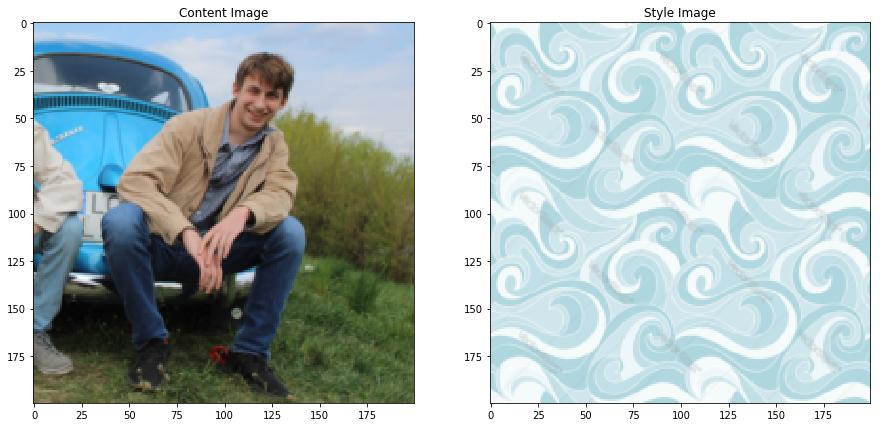

In [7]:
horizontal_display(images=[content_img, style_img], labels=['Content Image', 'Style Image'], size=15)

In [8]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

In [9]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [10]:
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

In [11]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [12]:
class Normalization(nn.Module):
    def __init__(self):
        super(Normalization, self).__init__()
        self.mean = torch.tensor([0.485, 0.456, 0.406]).to(device).view(-1, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225]).to(device).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

In [13]:
def get_style_model_and_losses(cnn, style_img, content_img):
    
    content_layers = [42]
    style_layers = [11, 21, 31, 41, 51]
    
    cnn = copy.deepcopy(cnn)

    normalization = Normalization().to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential()
    model.add_module('norm_0_0', normalization)

    lay = 1  # layer counter
    conv = 1  # conv+relu counter
    for layer in cnn.children():
        
        if isinstance(layer, nn.Conv2d):
            name = 'conv_{}_{}'.format(lay, conv)

        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}_{}'.format(lay, conv)
            layer = nn.ReLU(inplace=False)

        
        elif isinstance(layer, nn.MaxPool2d):
            layer = nn.AvgPool2d(kernel_size=2, stride=2, padding=0)
            name = 'pool_{}'.format(lay)

        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        
        if (lay * 10 + conv) in content_layers and 'relu' in name:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}_{}".format(lay, conv), content_loss)
            content_losses.append(content_loss)

        if (lay * 10 + conv) in style_layers and 'relu' in name:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}_{}".format(lay, conv), style_loss)
            style_losses.append(style_loss)

        if 'pool' in name:
            lay += 1
            conv = 1
        elif 'relu' in name:
            conv += 1

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

In [14]:
def run_style_transfer(net, content_img, style_img, input_img,
                       num_steps=1000, style_weight=100000, content_weight=1, lr=0.1):
    
    input_img = input_img.clone()
    images = [input_img, style_img, content_img]
    labels = ['Input Image', 'Style Image', 'Content Image']
    horizontal_display(images, labels)
   
       
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(net, style_img, content_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()], lr=lr)
      
    print('Optimizing..')
    run = [0]
    lowest_loss = [None]
    best_img = [0]
    plt.ion()
    while run[0] <= num_steps:
        
        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl, cl in zip(style_losses, content_losses):
                style_score += sl.loss
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                plt.figure()
                imshow(input_img, title='Output Image')
                print()
            if lowest_loss[0] == None or lowest_loss[0] > (style_score + content_score):
                lowest_loss[0] = style_score + content_score
                best_img[0] = input_img.clone()
            return style_score + content_score

        optimizer.step(closure)

    best_img[0].data.clamp_(0, 1)

    plt.figure()
    imshow(best_img[0], title='Output Image')
    return best_img[0]

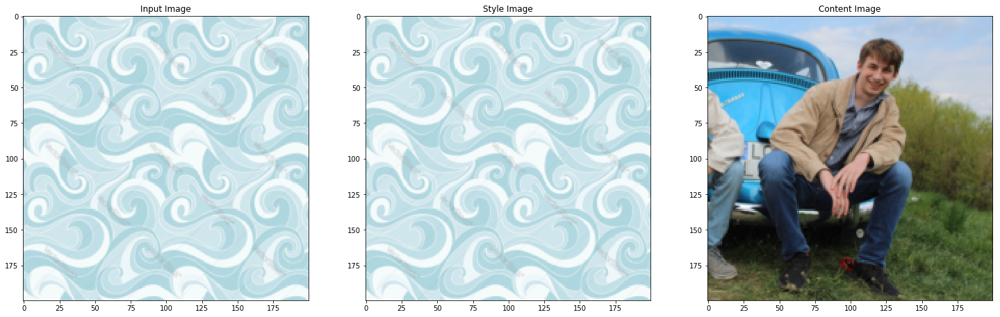

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.027129 Content Loss: 0.541413


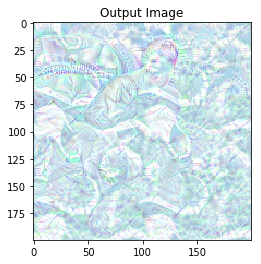


run [100]:
Style Loss : 0.016401 Content Loss: 0.179238


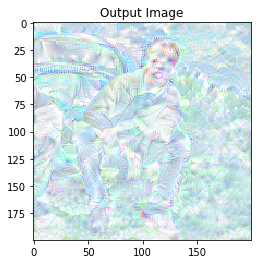


run [150]:
Style Loss : 0.012499 Content Loss: 0.083483


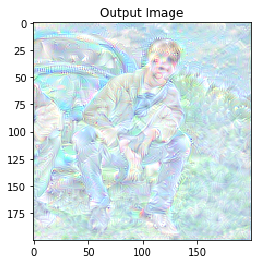


run [200]:
Style Loss : 0.010676 Content Loss: 0.050531


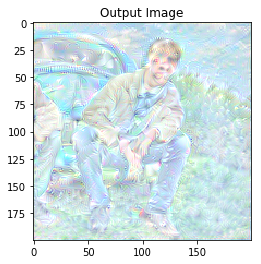


run [250]:
Style Loss : 0.009481 Content Loss: 0.035227


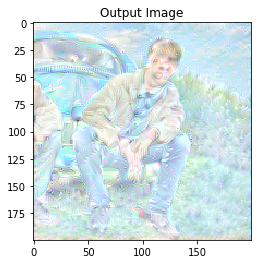


run [300]:
Style Loss : 0.008599 Content Loss: 0.027043


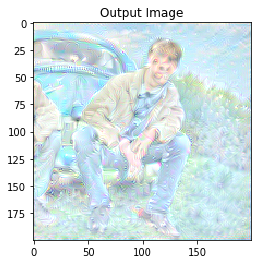


run [350]:
Style Loss : 0.007899 Content Loss: 0.022444


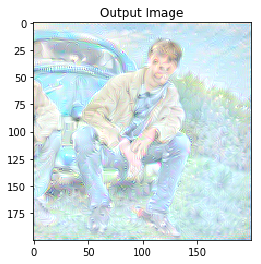


run [400]:
Style Loss : 0.007809 Content Loss: 0.019524


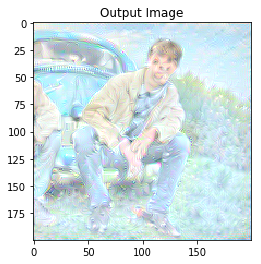


run [450]:
Style Loss : 0.008719 Content Loss: 0.018417


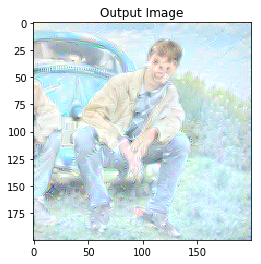


run [500]:
Style Loss : 0.009508 Content Loss: 0.016411


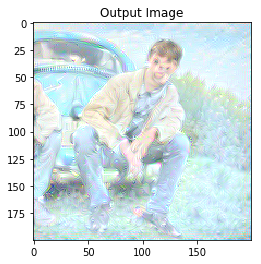


run [550]:
Style Loss : 0.065885 Content Loss: 0.091207


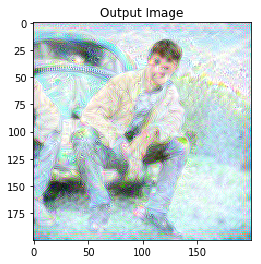


run [600]:
Style Loss : 0.028545 Content Loss: 0.031359


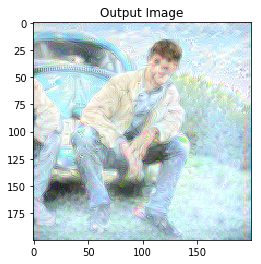


run [650]:
Style Loss : 0.016466 Content Loss: 0.021538


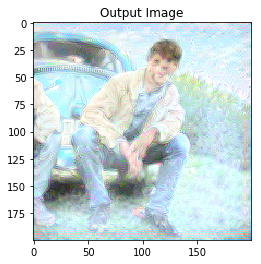


run [700]:
Style Loss : 0.012982 Content Loss: 0.021430


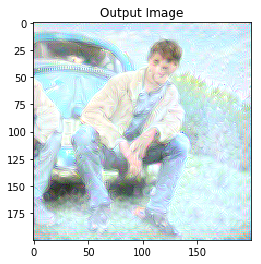


run [750]:
Style Loss : 0.166128 Content Loss: 0.216625


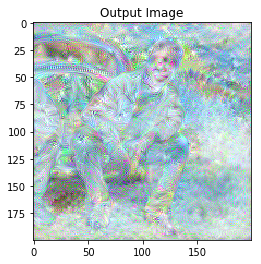


run [800]:
Style Loss : 0.068924 Content Loss: 0.091784


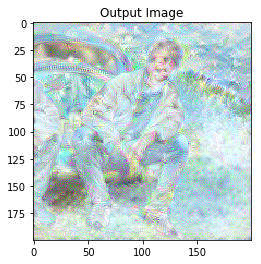


run [850]:
Style Loss : 0.018799 Content Loss: 0.049162


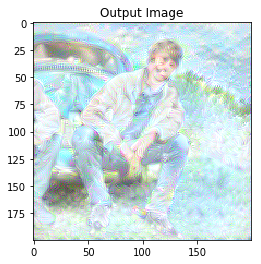


run [900]:
Style Loss : 0.010772 Content Loss: 0.032243


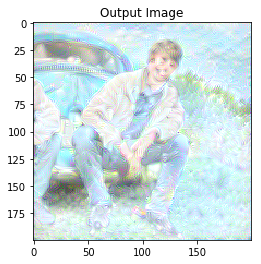


run [950]:
Style Loss : 0.008152 Content Loss: 0.023378


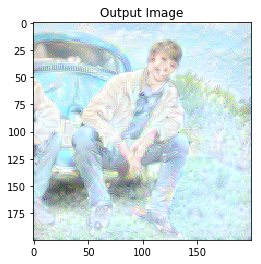


run [1000]:
Style Loss : 0.007707 Content Loss: 0.019109


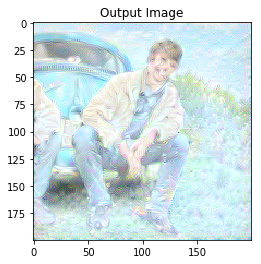

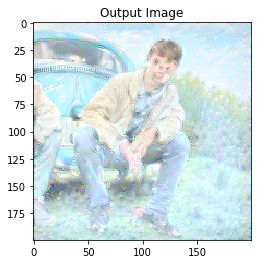

Done


In [15]:
output = run_style_transfer(cnn, content_img, style_img, style_img)
print('Done')

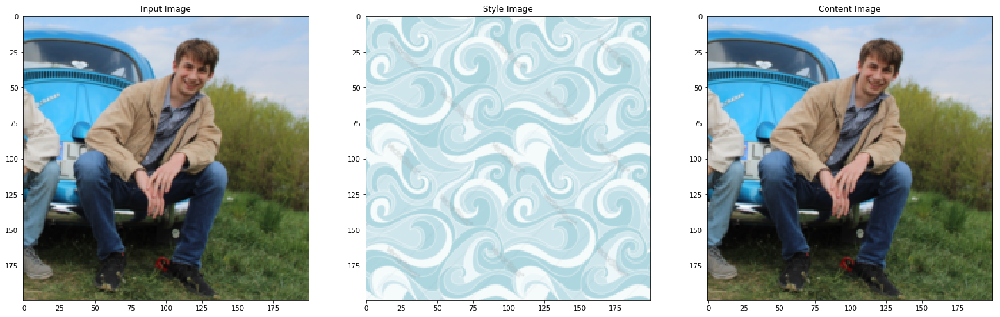

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.310620 Content Loss: 0.015699


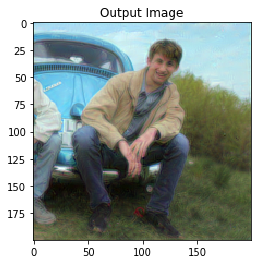


run [100]:
Style Loss : 0.228625 Content Loss: 0.027985


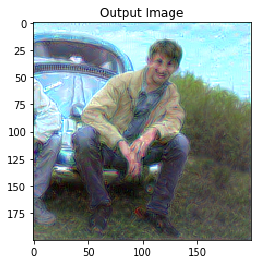


run [150]:
Style Loss : 6.843361 Content Loss: 1.131649


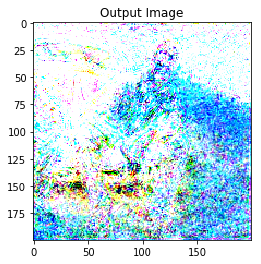


run [200]:
Style Loss : 0.096668 Content Loss: 0.185688


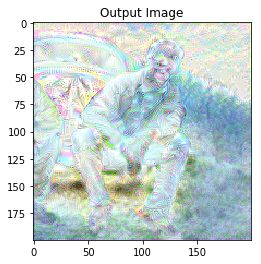


run [250]:
Style Loss : 0.030522 Content Loss: 0.097684


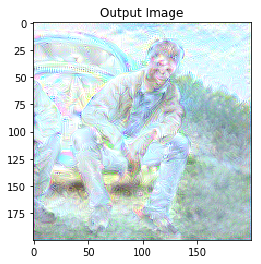


run [300]:
Style Loss : 0.022955 Content Loss: 0.102118


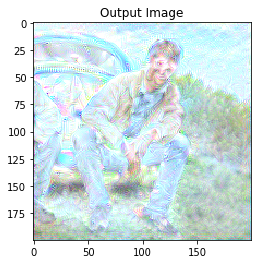


run [350]:
Style Loss : 0.021479 Content Loss: 0.055150


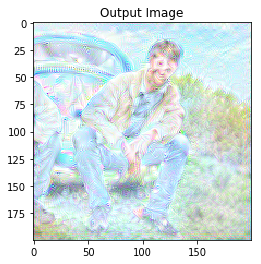


run [400]:
Style Loss : 0.011553 Content Loss: 0.032887


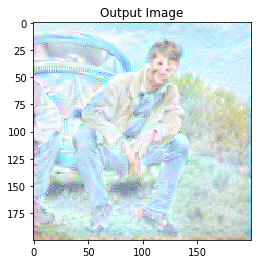


run [450]:
Style Loss : 0.010543 Content Loss: 0.026239


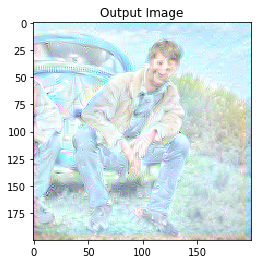


run [500]:
Style Loss : 0.010185 Content Loss: 0.022441


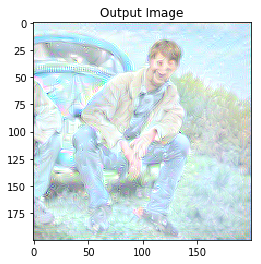


run [550]:
Style Loss : 0.010554 Content Loss: 0.020750


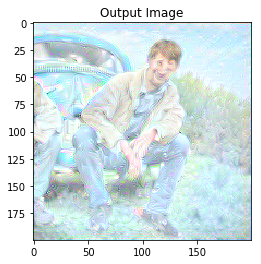


run [600]:
Style Loss : 0.057837 Content Loss: 0.070422


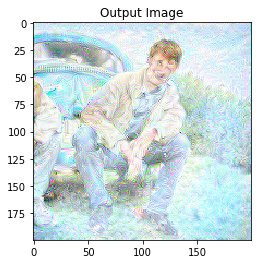


run [650]:
Style Loss : 0.014946 Content Loss: 0.023294


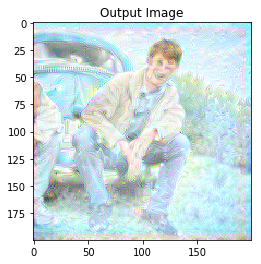


run [700]:
Style Loss : 0.012514 Content Loss: 0.023805


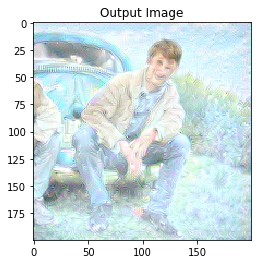


run [750]:
Style Loss : 0.466738 Content Loss: 0.447936


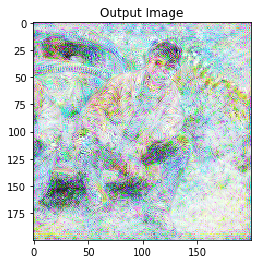


run [800]:
Style Loss : 0.077462 Content Loss: 0.103633


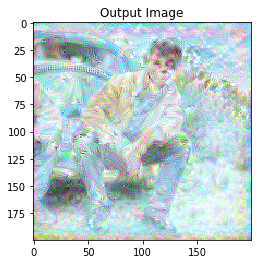


run [850]:
Style Loss : 0.028072 Content Loss: 0.048351


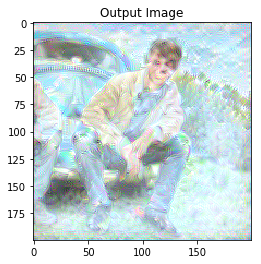


run [900]:
Style Loss : 0.014202 Content Loss: 0.031011


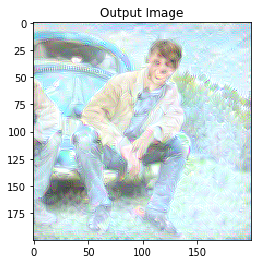


run [950]:
Style Loss : 0.010317 Content Loss: 0.024022


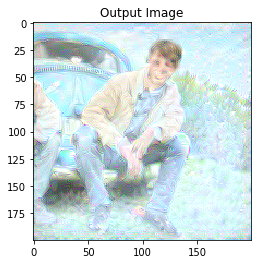


run [1000]:
Style Loss : 0.008499 Content Loss: 0.019443


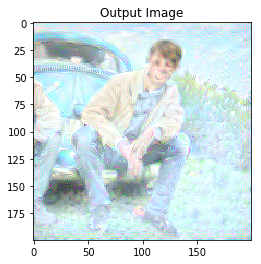

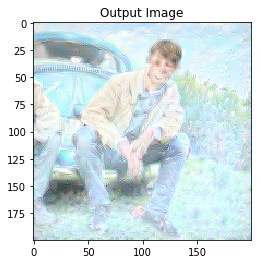

Done


In [16]:
output = run_style_transfer(cnn, content_img, style_img, content_img)
print('Done')

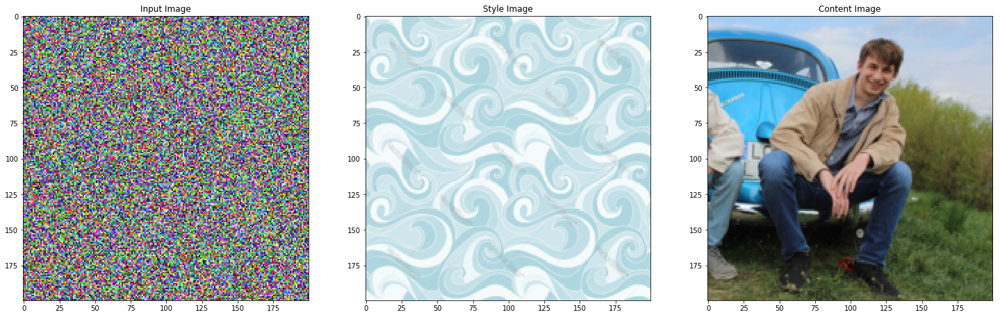

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.545396 Content Loss: 0.223602


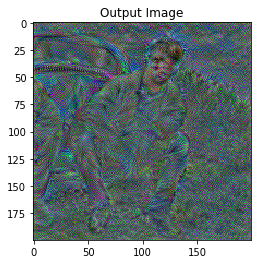


run [100]:
Style Loss : 0.503950 Content Loss: 0.075626


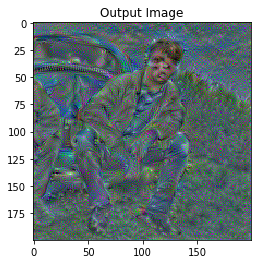


run [150]:
Style Loss : 0.471525 Content Loss: 0.037705


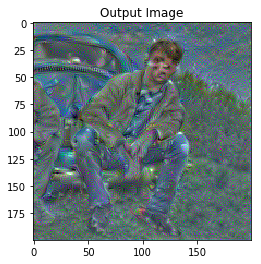


run [200]:
Style Loss : 0.425123 Content Loss: 0.026201


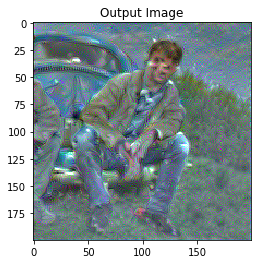


run [250]:
Style Loss : 0.241148 Content Loss: 0.050876


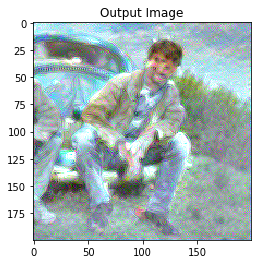


run [300]:
Style Loss : 0.132968 Content Loss: 0.107601


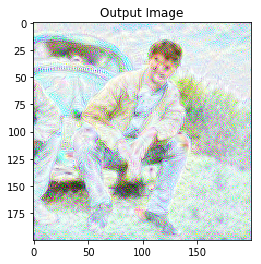


run [350]:
Style Loss : 0.023578 Content Loss: 0.033021


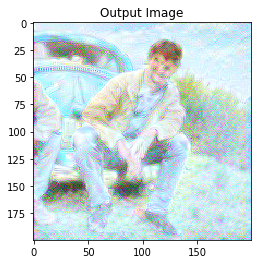


run [400]:
Style Loss : 0.013897 Content Loss: 0.025400


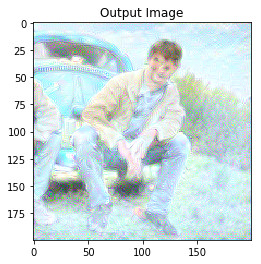


run [450]:
Style Loss : 0.010207 Content Loss: 0.020311


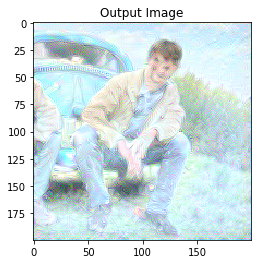


run [500]:
Style Loss : 0.008707 Content Loss: 0.016297


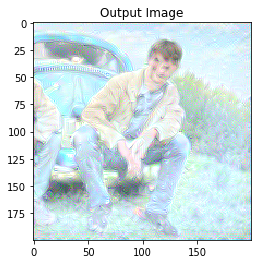


run [550]:
Style Loss : 0.007702 Content Loss: 0.014134


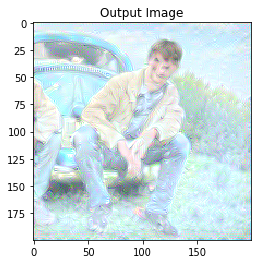


run [600]:
Style Loss : 0.007562 Content Loss: 0.013300


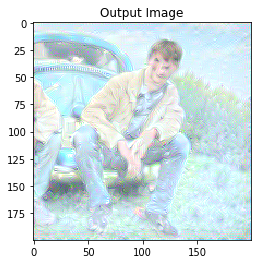


run [650]:
Style Loss : 0.088863 Content Loss: 0.132494


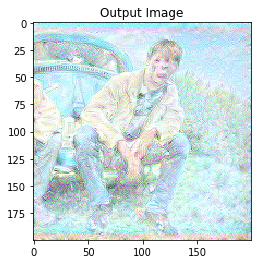


run [700]:
Style Loss : 0.019262 Content Loss: 0.026083


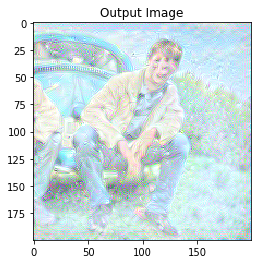


run [750]:
Style Loss : 0.012139 Content Loss: 0.019172


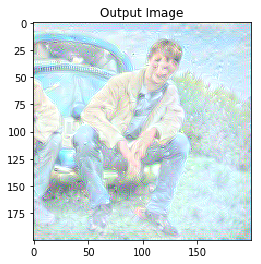


run [800]:
Style Loss : 0.153854 Content Loss: 0.220520


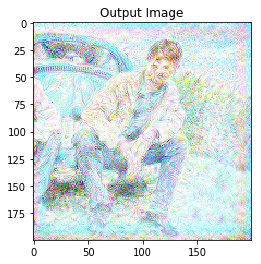


run [850]:
Style Loss : 0.019129 Content Loss: 0.033141


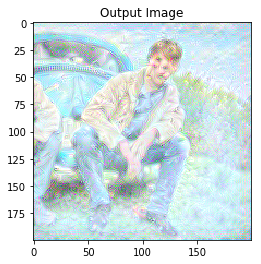


run [900]:
Style Loss : 0.011363 Content Loss: 0.019533


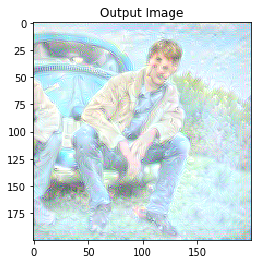


run [950]:
Style Loss : 0.112264 Content Loss: 0.140419


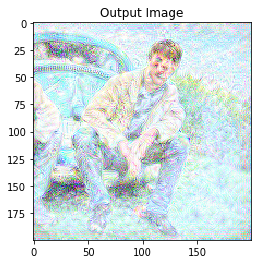


run [1000]:
Style Loss : 0.014789 Content Loss: 0.027863


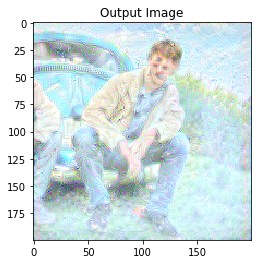

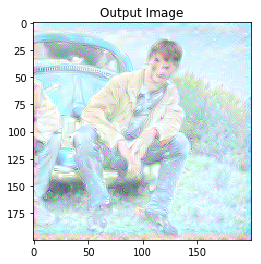

Done


In [17]:
output = run_style_transfer(cnn, content_img, style_img, torch.randn(content_img.data.size(), device=device))
print('Done')

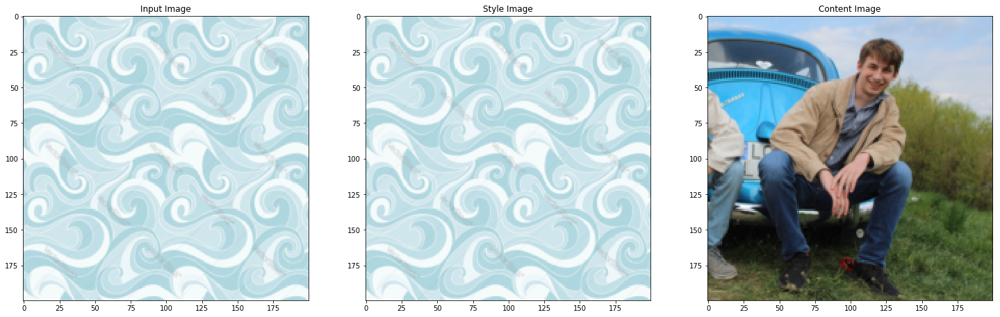

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.007546 Content Loss: 0.543186


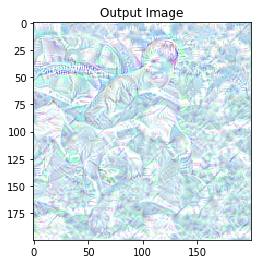


run [100]:
Style Loss : 0.013749 Content Loss: 0.163969


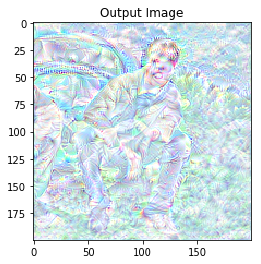


run [150]:
Style Loss : 0.009402 Content Loss: 0.070026


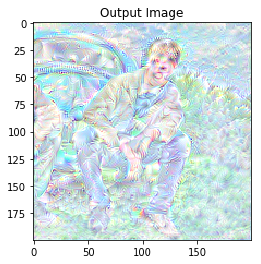


run [200]:
Style Loss : 0.007947 Content Loss: 0.039445


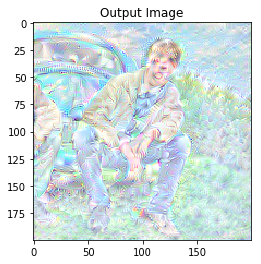


run [250]:
Style Loss : 0.006717 Content Loss: 0.025732


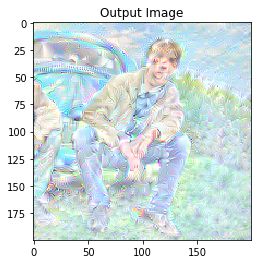


run [300]:
Style Loss : 0.005880 Content Loss: 0.018598


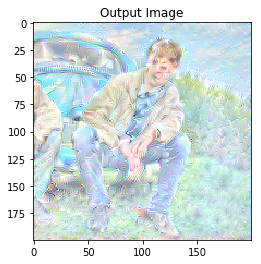


run [350]:
Style Loss : 0.005373 Content Loss: 0.014284


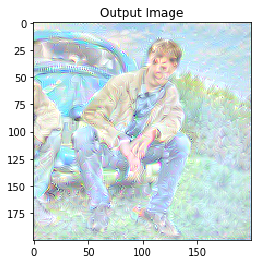


run [400]:
Style Loss : 0.004954 Content Loss: 0.011565


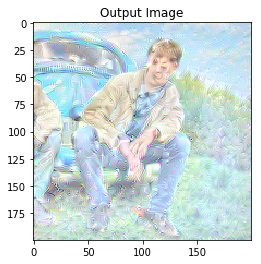


run [450]:
Style Loss : 0.004596 Content Loss: 0.009770


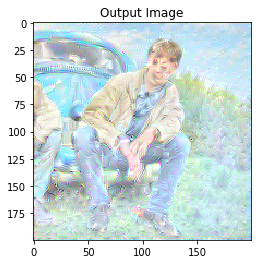


run [500]:
Style Loss : 0.004348 Content Loss: 0.008476


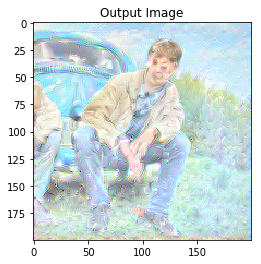


run [550]:
Style Loss : 0.004118 Content Loss: 0.007534


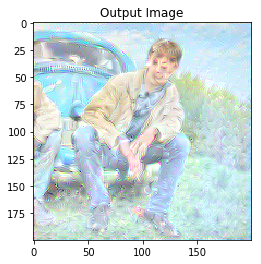


run [600]:
Style Loss : 0.004047 Content Loss: 0.006826


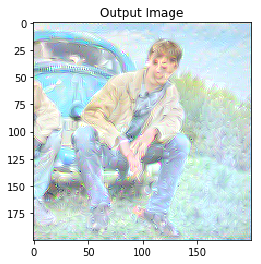


run [650]:
Style Loss : 0.004028 Content Loss: 0.006262


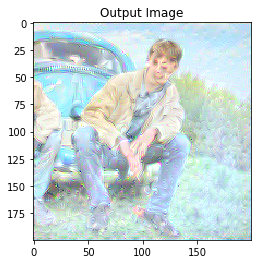


run [700]:
Style Loss : 0.004482 Content Loss: 0.007079


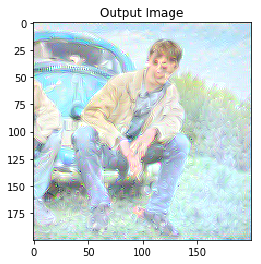


run [750]:
Style Loss : 0.004973 Content Loss: 0.017885


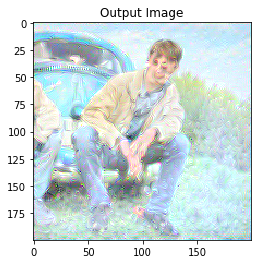


run [800]:
Style Loss : 0.045113 Content Loss: 0.057842


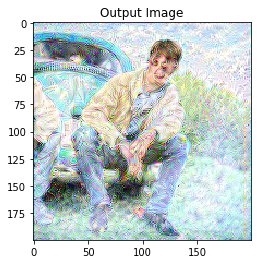


run [850]:
Style Loss : 0.014694 Content Loss: 0.016722


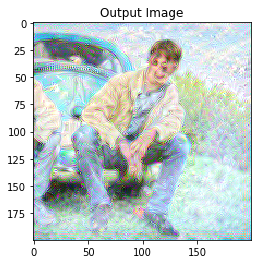


run [900]:
Style Loss : 0.009304 Content Loss: 0.009013


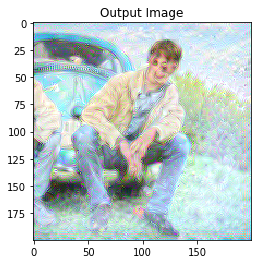


run [950]:
Style Loss : 0.007269 Content Loss: 0.006152


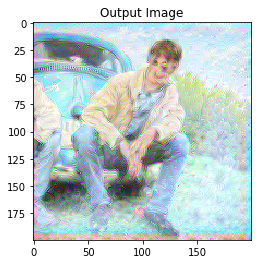


run [1000]:
Style Loss : 0.006140 Content Loss: 0.004819


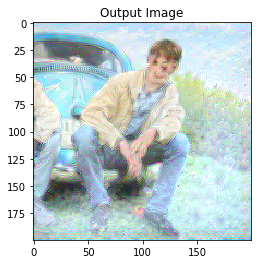

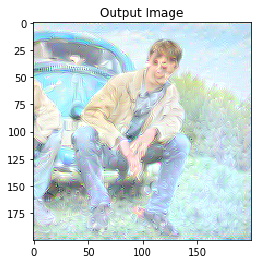

Done


In [18]:
output = run_style_transfer(cnn, content_img, style_img, style_img, style_weight=10000)
print('Done')